In [1]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
import scanpy as sc

from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOMASKVIR as HALOVI
from complementary_models import HALOMASKVAE as HALOVAE
import scvi
import pandas as pd

import matplotlib.pyplot as plt

Global seed set to 0


In [2]:
adata_multi = sc.read_10x_mtx('./data/datasets/NEAT_Seq/outputs/RNA_ATAC/',gex_only=False)
metadata = pd.read_csv('./data/datasets/NEAT_Seq/outputs/metadata.csv',index_col = 0)
adata_multi.obs = pd.merge(adata_multi.obs, metadata, left_index=True, right_index=True)

In [3]:
adata_multi

AnnData object with n_obs × n_vars = 3841 × 117554
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm'
    var: 'gene_ids', 'feature_types'

In [4]:
sc.pp.filter_genes(adata_multi, min_cells=10)

In [5]:
adata_multi.obs["batch_id"] = 1
adata_multi.var["modality"] =adata_multi.var["feature_types"]
adata_multi.var["modality"].value_counts()
adata_mvi = scvi.data.organize_multiome_anndatas(adata_multi)
adata_mvi 

AnnData object with n_obs × n_vars = 3841 × 92370
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality'

In [6]:
adata_mvi.obs['Clusters'] = adata_mvi.obs['Clusters'].astype(str).astype('category')
old_to_new = dict(
    C1='Act.',
    C2='Treg',
    C3='Th17',
    C4='Tcm',
    C5='Th2',
    C6='Th1',
    C7='Uncom.'
)
adata_mvi.obs['new_clusters'] = (
    adata_mvi.obs['Clusters']
    .map(old_to_new)
    .astype('category')
)

Cluster_color = {
                "Act.": "#D51F26",
                "Treg": "#272E6A",
                "Th17": "#208A42",
                "Tcm": "#89288F",
                "Th2": "#F47D2B",
                "Th1": "#FEE500",
                "Uncom.": "#8A9FD1"    
                }

# adata_mvi.obs['GATA3-norm'] = (adata_mvi.obs['GATA3-norm'] - adata_mvi.obs['GATA3-norm'].min()) / (adata_mvi.obs['GATA3-norm'].max() - adata_mvi.obs['GATA3-norm'].min())
adata_mvi.obs['new_clusters'].value_counts()

Tcm       1152
Th17       851
Th1        685
Th2        436
Uncom.     421
Treg       249
Act.        47
Name: new_clusters, dtype: int64

# HALO Training

In [7]:
HALOVI.setup_anndata(adata_mvi, batch_key="modality", time_key='GATA3-norm')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var['feature_types']=='Gene Expression').sum(),
    n_regions=(adata_mvi.var['feature_types']=='Peaks').sum(),
    n_layers = 2,
    n_latent = 50,
    n_dependent=25
)

n_genes :13799
n_peaks:78571
fine tune is False
gate decoder initialization n_input 50, n_output 78571,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


In [9]:
## train both RNA and ATAC
import warnings
warnings.filterwarnings("ignore")
model.module.set_finetune_params(0)
model.module.set_train_params(expr_train=True, acc_train=True)
model.train(max_epochs=1000, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 8/1000:   1%|          | 7/1000 [00:20<49:09,  2.97s/it, loss=6.36e+04, v_num=1]

In [9]:
model.save("model_NEAT_seq_50LF_nocausal_epoch1000",overwrite=True)

In [10]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

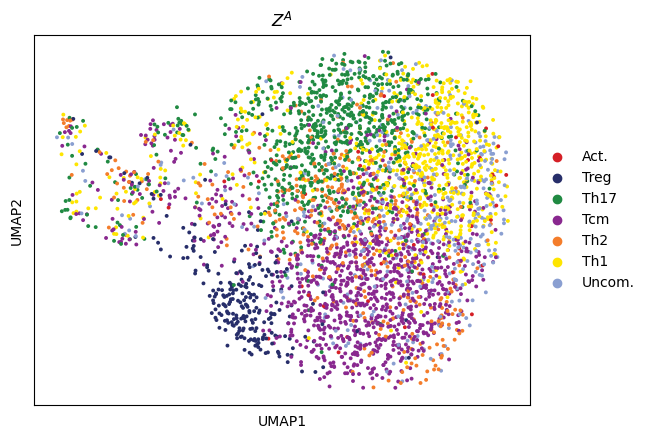

In [11]:
adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

# %matplotlib inline
# sc.pl.umap(adatssa_mvi,color='GATA3-norm',title = '$Z^{A}$',
#        vmin = 'p2', vmax= 'p98')
# plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()

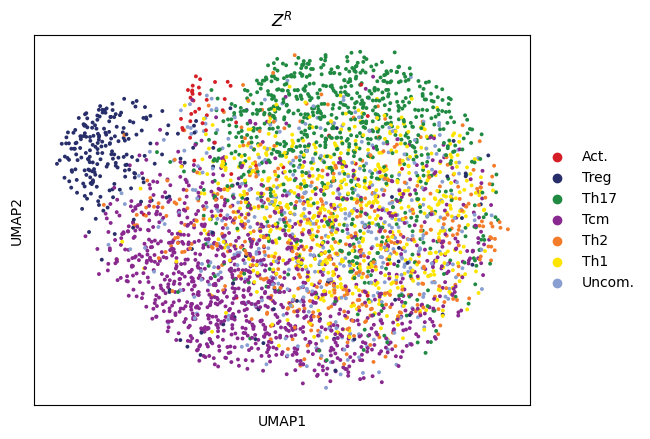

In [12]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
#        vmin = 'p2', vmax= 'p98')
# plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

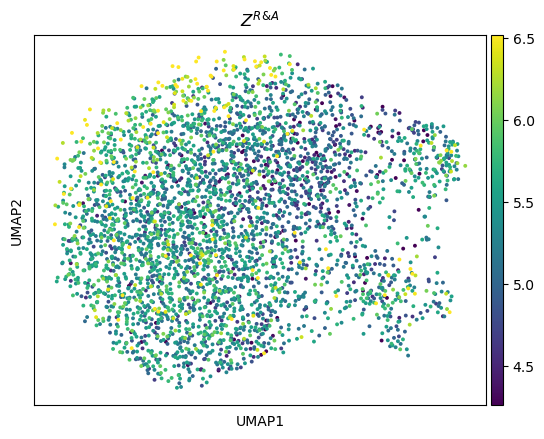

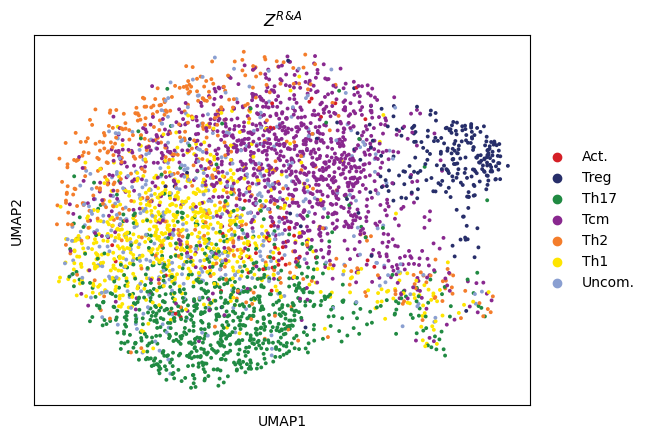

In [13]:
adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [14]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [27:46<00:00,  3.33s/it, loss=5.37e+04, v_num=1]


In [15]:
model.save("model_NEAT_seq_50LF_nocausal_epoch1500",overwrite=True)

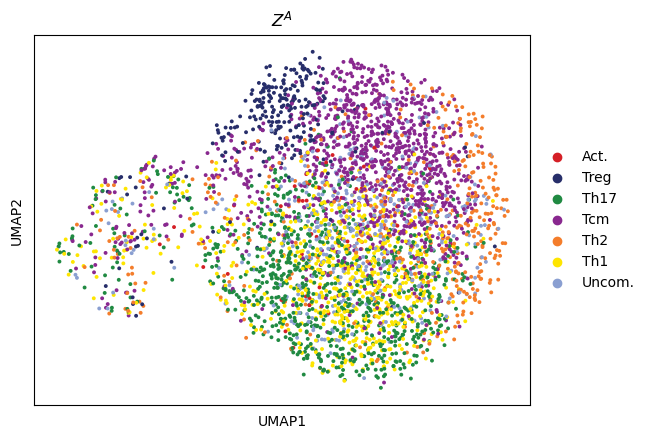

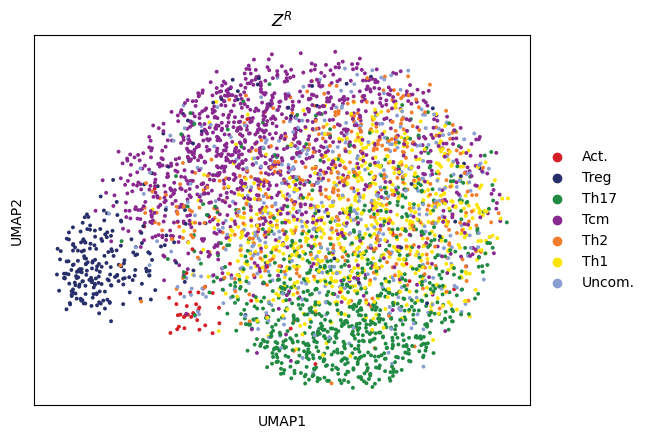

In [16]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [17]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [27:31<00:00,  3.30s/it, loss=5.38e+04, v_num=1]


In [20]:
model.save("model_NEAT_seq_50LF_nocausal_epoch2000",overwrite=True)

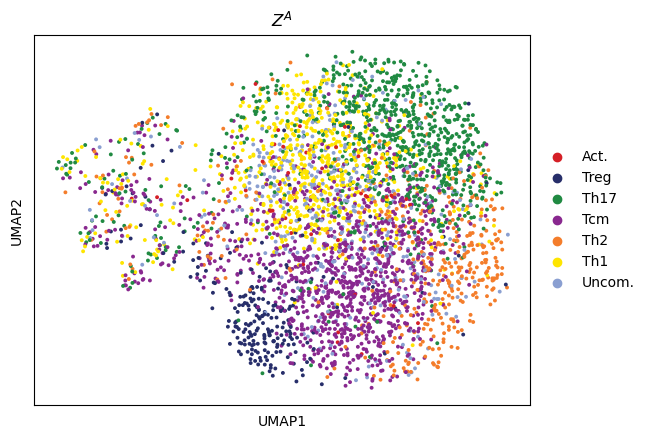

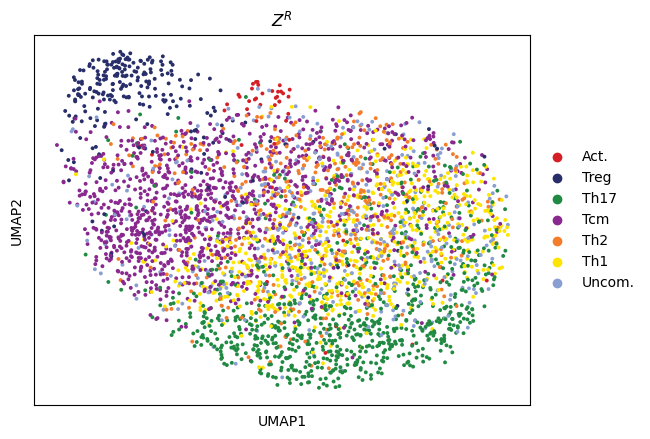

In [21]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [22]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [28:29<00:00,  3.42s/it, loss=5.37e+04, v_num=1]


In [24]:
model.save("model_NEAT_seq_50LF_nocausal_epoch2500",overwrite=True)

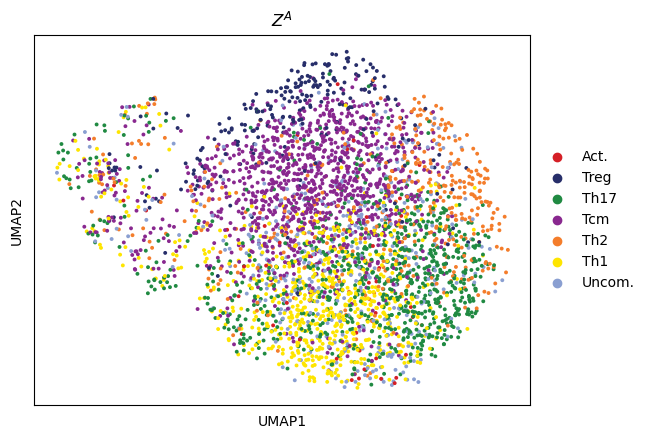

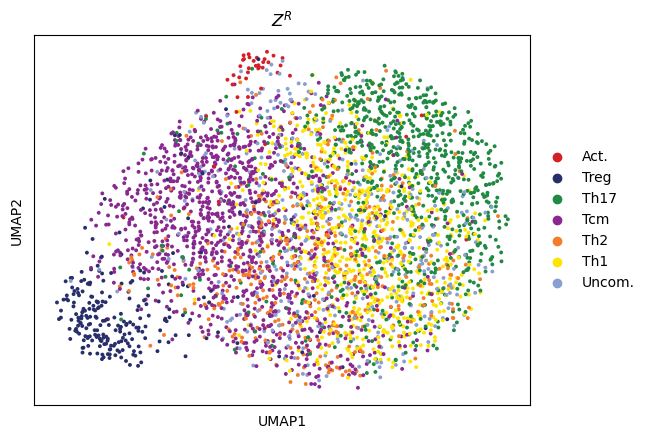

In [23]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [25]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|██████████| 500/500 [28:13<00:00,  3.39s/it, loss=5.38e+04, v_num=1]


In [26]:
model.save("model_NEAT_seq_50LF_nocausal_epoch3000",overwrite=True)

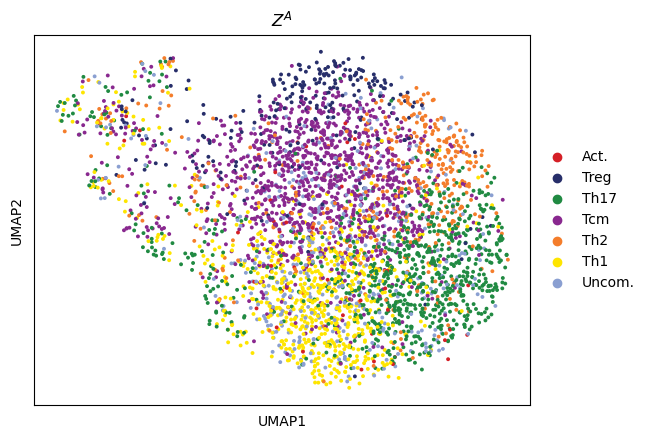

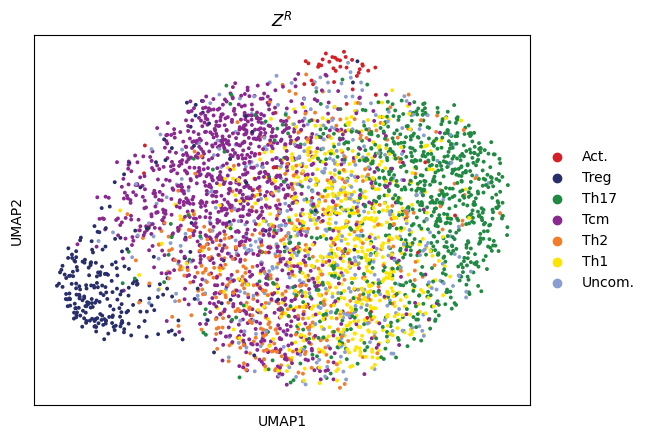

In [27]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

# Causal Constrain

In [ ]:
# model = model.load("model_NEAT_seq_50LF_nocausal_epoch2000",adata_mvi)

In [ ]:
# latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

# adata_mvi.obsm["latent"] = latent_expr
# sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

# sc.tl.umap(adata_mvi,min_dist =0.5)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm', vmin = 'p2', vmax= 'p98')
# plt.show()

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='new_clusters',palette=Cluster_color)
# plt.show()

# adata_mvi.obsm["latent"] = latent_acc
# sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

# sc.tl.umap(adata_mvi,min_dist =0.5)

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='GATA3-norm', vmin = 'p2', vmax= 'p98')
# plt.show()

# %matplotlib inline
# sc.pl.umap(adata_mvi,color='new_clusters',palette=Cluster_color)
# plt.show()

In [28]:
model.module.alpha = 0.05
model.module.beta_2 = 1e7
model.module.beta_3 = 2e8
model.module.beta_1 = 1e7
print(model.module.alpha)

0.05


In [29]:
## finetune without L0
model.module.set_finetune_params(2)
model.module.set_train_params(expr_train=True, acc_train=True)
model.plan_kwargs = {"n_epochs_kl_warmup":300}
model.train(max_epochs=500, batch_size=512)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.25E+04, nod_loss 8.05E+04
reconst_loss 5.33E+04, nod_loss 6.61E+04
reconst_loss 5.38E+04, nod_loss 6.35E+04
reconst_loss 5.32E+04, nod_loss 6.28E+04
reconst_loss 5.40E+04, nod_loss 5.09E+04
reconst_loss 5.42E+04, nod_loss 7.93E+04
reconst_loss 5.42E+04, nod_loss 7.40E+04
Epoch 2/500:   0%|          | 1/500 [00:03<29:07,  3.50s/it, loss=1.22e+05, v_num=1]reconst_loss 5.43E+04, nod_loss 7.26E+04
reconst_loss 5.36E+04, nod_loss 3.62E+04
reconst_loss 5.30E+04, nod_loss 7.52E+04
reconst_loss 5.37E+04, nod_loss 7.95E+04
reconst_loss 5.35E+04, nod_loss 5.39E+04
reconst_loss 5.30E+04, nod_loss 6.81E+04
reconst_loss 5.38E+04, nod_loss 7.80E+04
Epoch 3/500:   0%|          | 2/500 [00:06<27:51,  3.36s/it, loss=1.21e+05, v_num=1]reconst_loss 5.35E+04, nod_loss 6.70E+04
reconst_loss 5.32E+04, nod_loss 6.06E+04
reconst_loss 5.43E+04, nod_loss 5.89E+04
reconst_loss 5.34E+04, nod_loss 1.07E+05
reconst_loss 5.34E+04, nod_loss 6.84E+04
r

In [30]:
model.save("model_NEAT_seq_50LF_causal_alpha_0.05_epoch_500",overwrite=True)

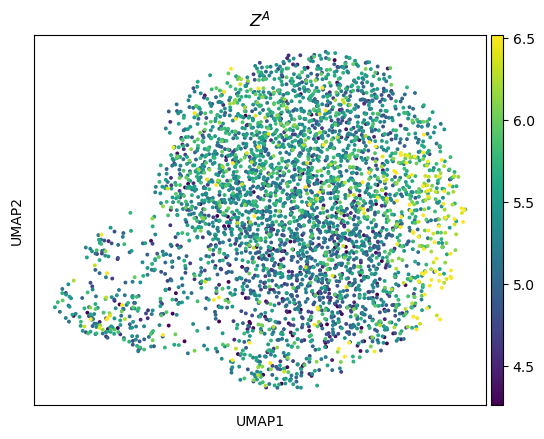

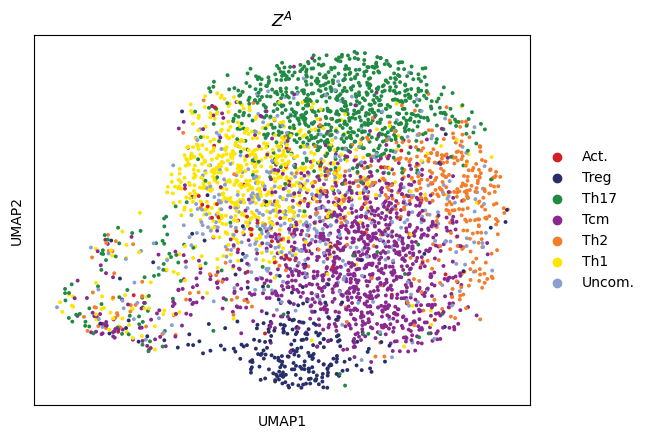

In [31]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()

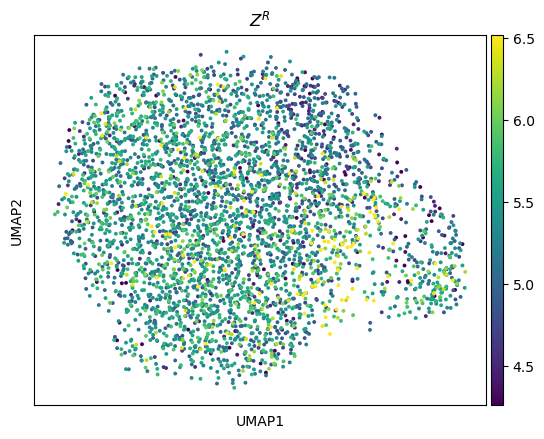

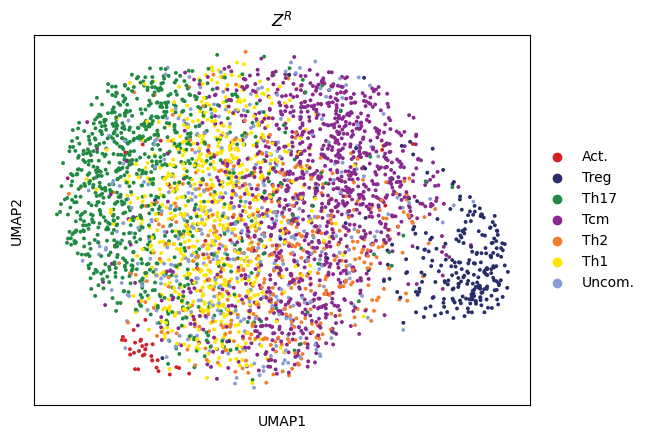

In [32]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

In [33]:
model.train(max_epochs=500, batch_size=512)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.36E+04, nod_loss 4.57E+04
reconst_loss 5.32E+04, nod_loss 7.75E+04
reconst_loss 5.36E+04, nod_loss 7.82E+04
reconst_loss 5.31E+04, nod_loss 6.77E+04
reconst_loss 5.39E+04, nod_loss 9.15E+04
reconst_loss 5.36E+04, nod_loss 4.45E+04
reconst_loss 5.47E+04, nod_loss 9.83E+04
Epoch 2/500:   0%|          | 1/500 [00:03<25:35,  3.08s/it, loss=1.26e+05, v_num=1]reconst_loss 5.42E+04, nod_loss 7.10E+04
reconst_loss 5.43E+04, nod_loss 4.91E+04
reconst_loss 5.32E+04, nod_loss 8.53E+04
reconst_loss 5.31E+04, nod_loss 3.66E+04
reconst_loss 5.35E+04, nod_loss 8.65E+04
reconst_loss 5.38E+04, nod_loss 5.90E+04
reconst_loss 5.31E+04, nod_loss 7.88E+04
Epoch 3/500:   0%|          | 2/500 [00:06<25:34,  3.08s/it, loss=1.23e+05, v_num=1]reconst_loss 5.31E+04, nod_loss 8.17E+04
reconst_loss 5.41E+04, nod_loss 9.99E+04
reconst_loss 5.33E+04, nod_loss 2.59E+04
reconst_loss 5.33E+04, nod_loss 5.79E+04
reconst_loss 5.35E+04, nod_loss 5.46E+04
r

In [34]:
model.save("model_NEAT_seq_50LF_causal_alpha_0.05_epoch_1000",overwrite=True)

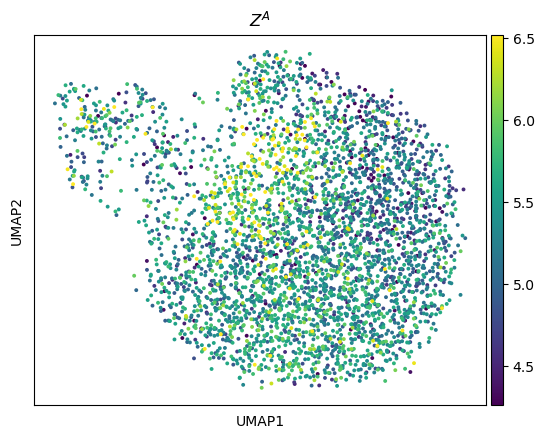

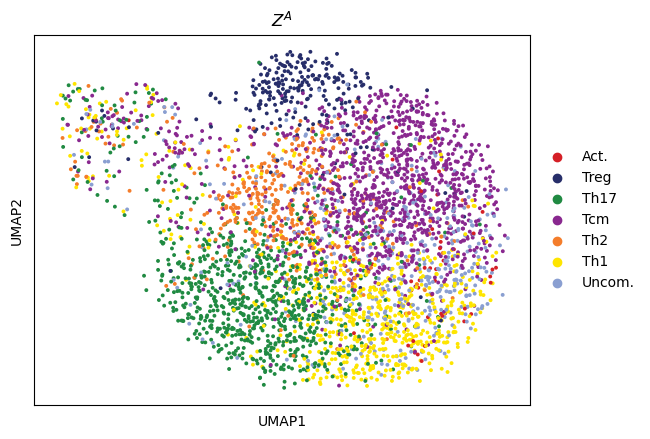

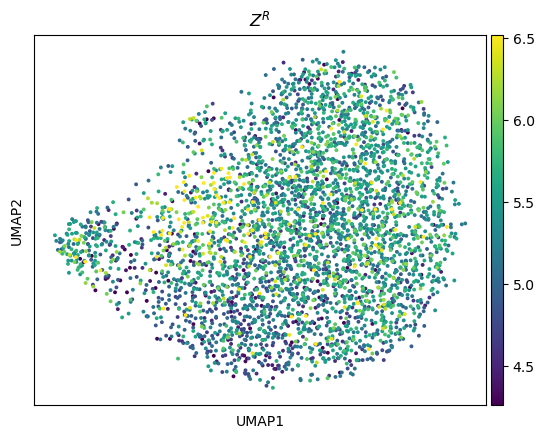

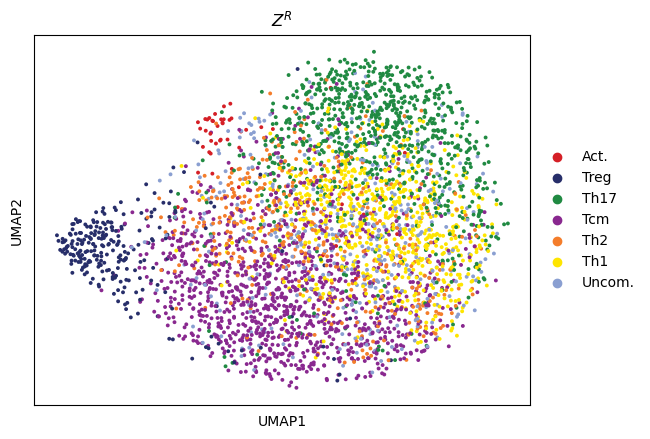

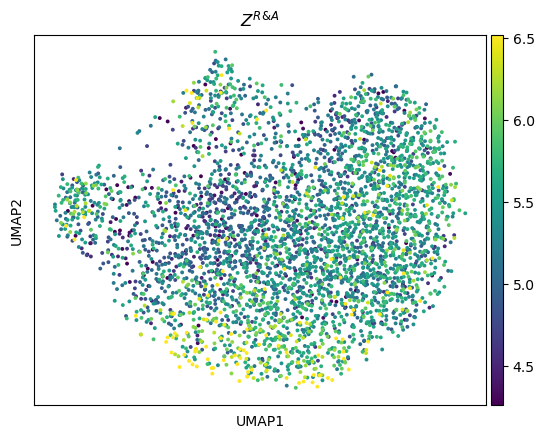

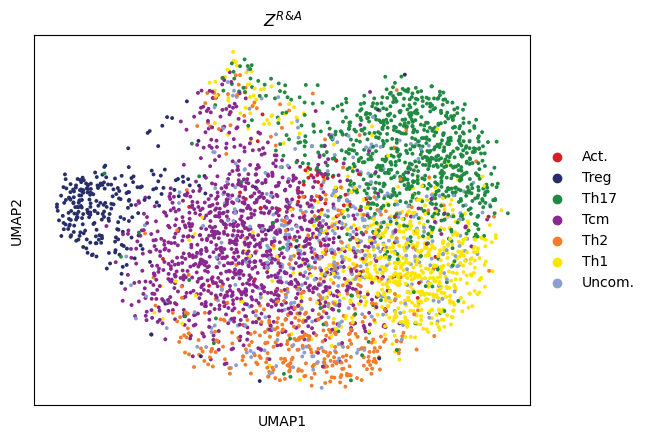

In [35]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [36]:
model.train(max_epochs=500, batch_size=256)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]reconst_loss 5.29E+04, nod_loss 9.53E+04
reconst_loss 5.39E+04, nod_loss 7.23E+04
reconst_loss 5.31E+04, nod_loss 1.18E+05
reconst_loss 5.32E+04, nod_loss 8.71E+04
reconst_loss 5.41E+04, nod_loss 1.16E+05
reconst_loss 5.48E+04, nod_loss 9.18E+04
reconst_loss 5.41E+04, nod_loss 1.43E+05
reconst_loss 5.27E+04, nod_loss 1.51E+05
reconst_loss 5.39E+04, nod_loss 8.06E+04
reconst_loss 5.45E+04, nod_loss 9.89E+04
reconst_loss 5.34E+04, nod_loss 1.34E+05
reconst_loss 5.28E+04, nod_loss 8.43E+04
reconst_loss 5.42E+04, nod_loss 1.12E+05
reconst_loss 5.32E+04, nod_loss 1.71E+05
Epoch 2/500:   0%|          | 1/500 [00:04<36:35,  4.40s/it, loss=1.65e+05, v_num=1]reconst_loss 5.47E+04, nod_loss 1.12E+05
reconst_loss 5.28E+04, nod_loss 1.33E+05
reconst_loss 5.33E+04, nod_loss 6.53E+04
reconst_loss 5.26E+04, nod_loss 8.67E+04
reconst_loss 5.36E+04, nod_loss 1.33E+05
reconst_loss 5.38E+04, nod_loss 8.29E+04
reconst_loss 5.40E+04, nod_loss 1.07E+05
rec

In [37]:
model.save("model_NEAT_seq_40LF_causal_alpha_0.05_epoch_1500",overwrite=True)

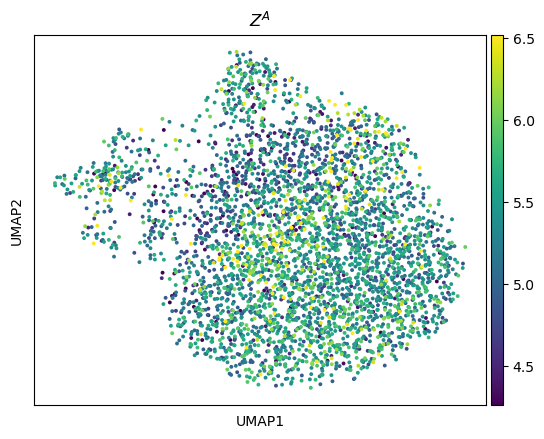

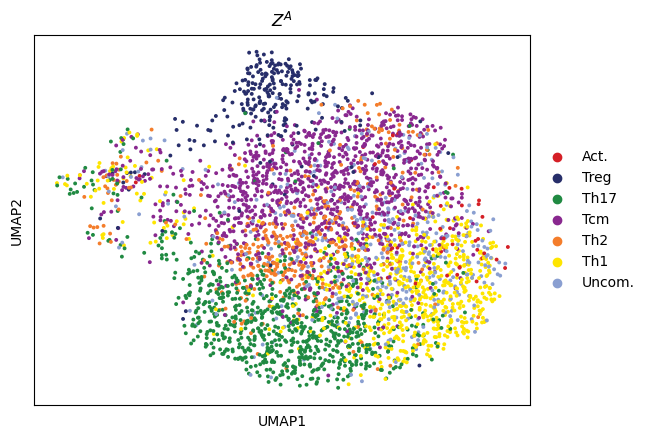

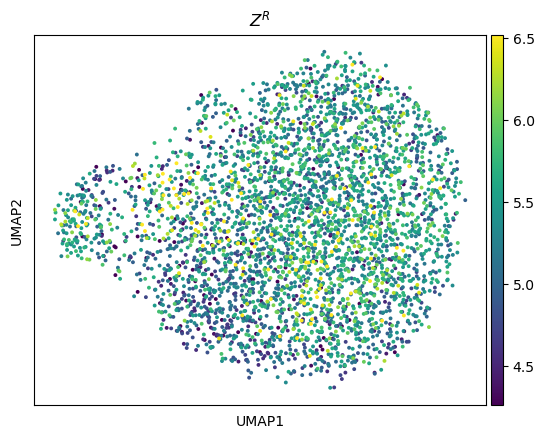

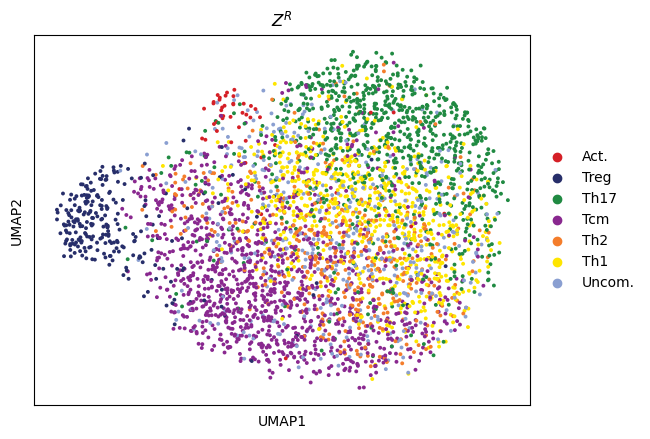

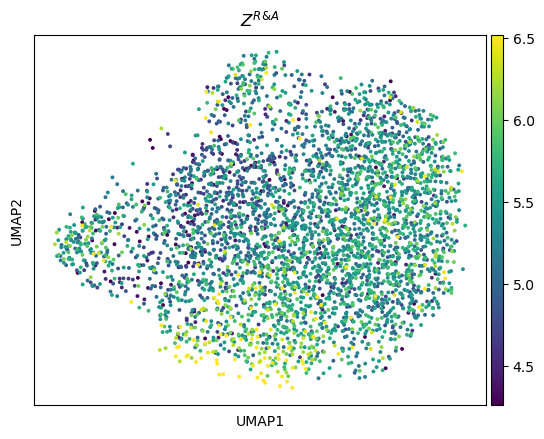

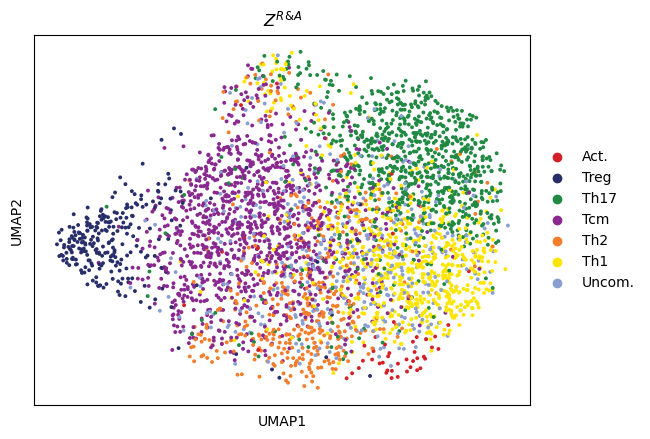

In [38]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

# visualize

In [8]:
model = model.load("model_NEAT_seq_50LF_causal_alpha_0.05_epoch_1500",adata_mvi)

INFO     File model_NEAT_seq_50LF_causal_alpha_0.05_epoch_1500/model.pt already downloaded   
n_genes :13799
n_peaks:78571
fine tune is False
gate decoder initialization n_input 50, n_output 78571,         n_hidden_local 20, n_hidden_global 128, n_cat_list [1], *cat_list 1


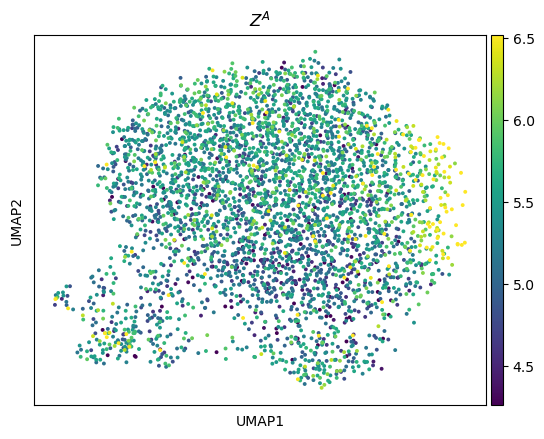

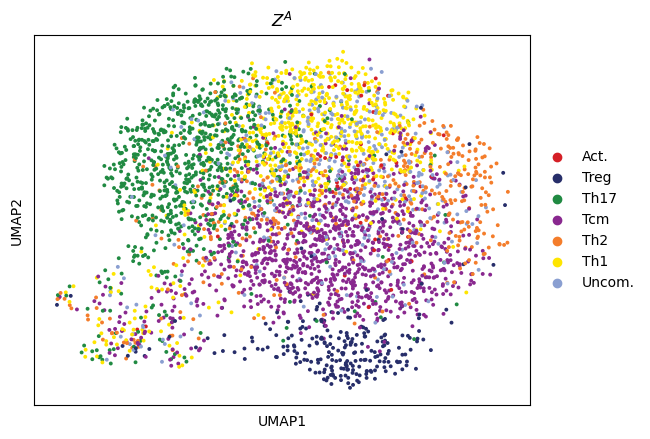

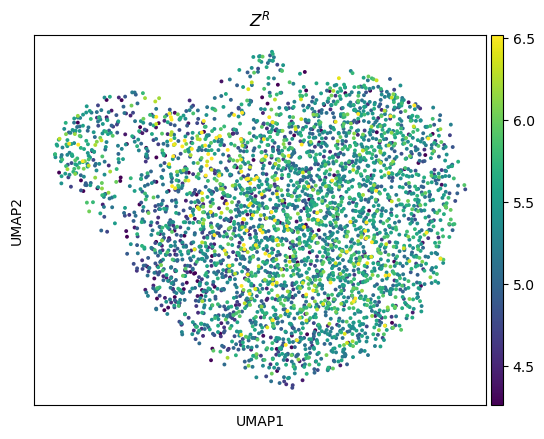

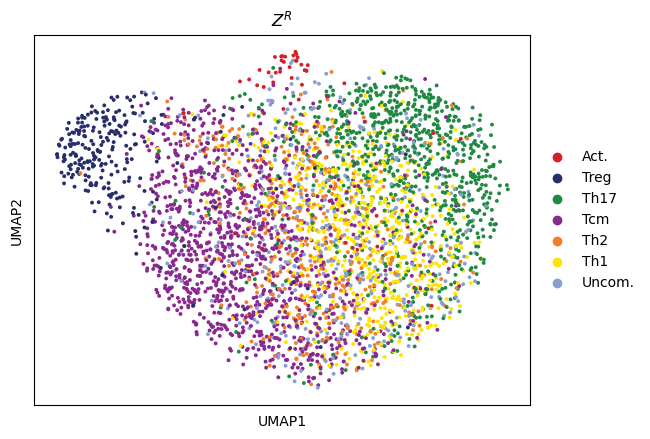

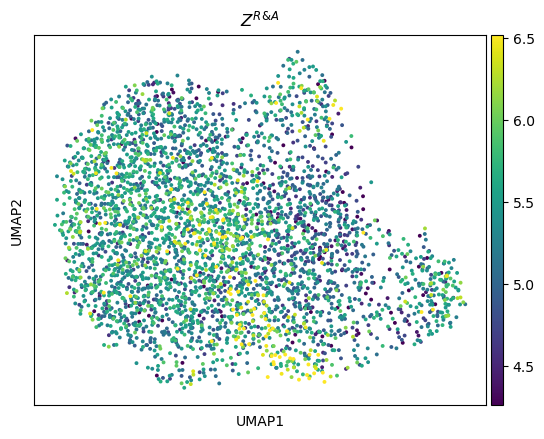

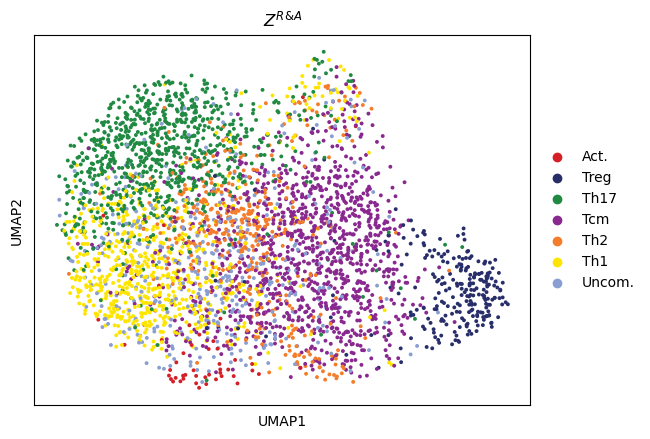

In [9]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{A}$',
                palette=Cluster_color
             )
plt.show()


adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R}$',
                palette=Cluster_color
             )
plt.show()

adata_mvi.obsm["latent"] = np.concatenate((latent_expr, latent_acc), axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()

In [12]:
adata_mvi

AnnData object with n_obs × n_vars = 3841 × 92370
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_id', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'Clusters', 'ReadsInPeaks', 'FRIP', 'cell_id2', 'nCount_ATAC', 'nFeature_ATAC', 'nCount_ChromVar', 'nFeature_ChromVar', 'RNA_snn_res.0.6', 'seurat_clusters', 'nCount_ADT', 'nFeature_ADT', 'S.Score', 'G2M.Score', 'Phase', 'FOXP3-norm', 'Helios-norm', 'Tbet-norm', 'GATA3-norm', 'RORgT-norm', 'batch_id', 'modality', 'new_clusters', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'n_cells', 'modality'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'new_clusters_colors'
    obsm: 'latent', 'X_umap'
    obsp: 'distances', 'connectivities'

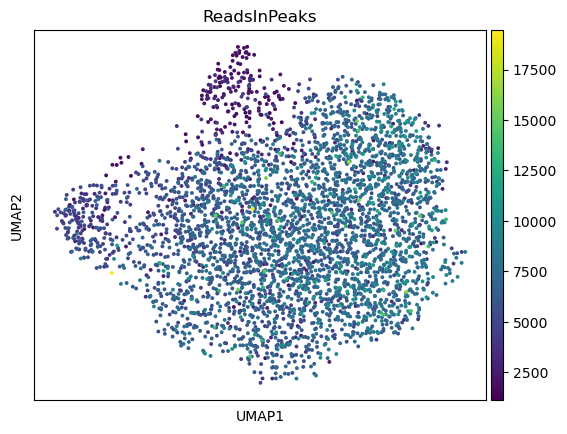

In [24]:
sc.pl.umap(adata_mvi,color=['ReadsInPeaks'])

In [29]:
adata_mvi = adata_mvi[adata_mvi.obs.ReadsInPeaks > 4000, :]

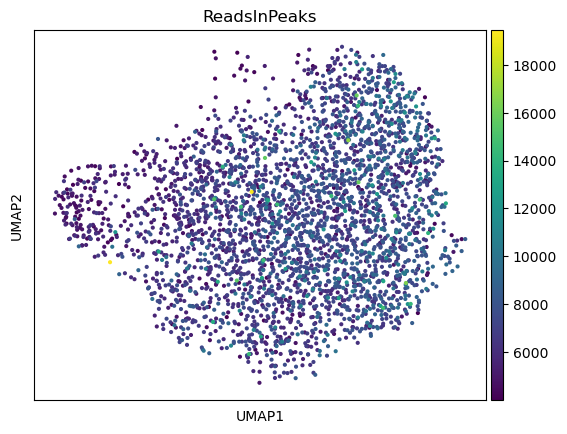

In [30]:
sc.pl.umap(adata_mvi,color=['ReadsInPeaks'])

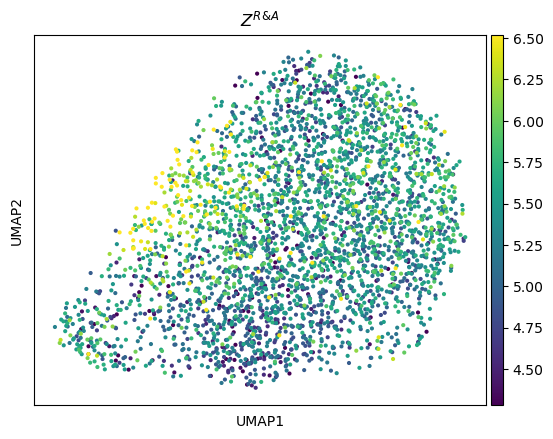

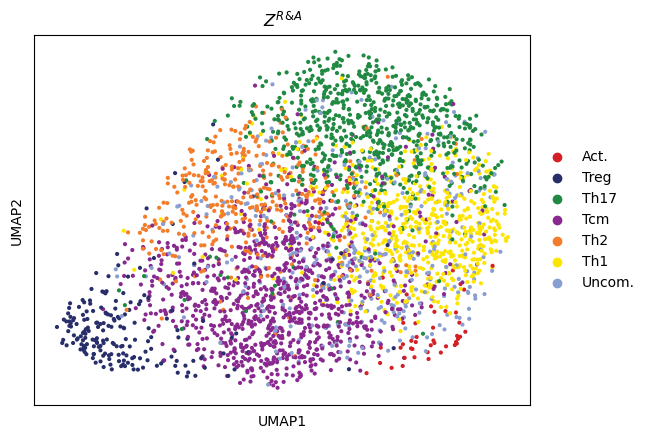

In [11]:
adata_mvi = adata_mvi[adata_mvi.obs.ReadsInPeaks > 4000, :]


sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)

%matplotlib inline
sc.pl.umap(adata_mvi,color='GATA3-norm',title = '$Z^{R & A}$',
       vmin = 'p2', vmax= 'p98')
plt.show()

%matplotlib inline
sc.pl.umap(adata_mvi,color='new_clusters',title = '$Z^{R & A}$',
                palette=Cluster_color
             )
plt.show()